# Imports

In [104]:
# standard libraries
import numpy as np
import pandas as pd

# geographic plotting
import geopandas as gpd
import json

# visualization
import altair as alt

# other
import requests

In [87]:
# enable altair visualizations
alt.renderers.enable()

# opaque background
alt.themes.enable('opaque')

ThemeRegistry.enable('opaque')

In [89]:
alt.__version__

'2.4.1'

# Atlanta Crime Data

In [16]:
df = pd.read_csv('COBRA-2009-2018.csv')
df['Beat'] = df['Beat'].fillna(0).astype('uint32')

C:\Users\Jake\Anaconda3\envs\mainenv\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 317904 entries, 0 to 317903
Data columns (total 19 columns):
Report Number              317904 non-null int64
Report Date                317904 non-null object
Occur Date                 317904 non-null object
Occur Time                 317904 non-null int64
Possible Date              317886 non-null object
Possible Time              317885 non-null float64
Beat                       317904 non-null uint32
Apartment Office Prefix    9570 non-null object
Apartment Number           64077 non-null object
Location                   317902 non-null object
Shift Occurence            317904 non-null object
Location Type              310373 non-null object
UCR Literal                317904 non-null object
UCR #                      317904 non-null int64
IBR Code                   317748 non-null object
Neighborhood               306464 non-null object
NPU                        317780 non-null object
Latitude                   317904 non-null f

In [18]:
df.head()

,Report Number,Report Date,Occur Date,Occur Time,Possible Date,Possible Time,Beat,Apartment Office Prefix,Apartment Number,Location,Shift Occurence,Location Type,UCR Literal,UCR #,IBR Code,Neighborhood,NPU,Latitude,Longitude
0,90010930,2009-01-01,2009-01-01,1145,2009-01-01,1148.0,408,NaN,NaN,2841 GREENBRIAR PKWY,Day Watch,8,LARCENY-NON VEHICLE,630,2303,Greenbriar,R,33.68845,-84.49328
1,90011083,2009-01-01,2009-01-01,1330,2009-01-01,1330.0,506,NaN,NaN,12 BROAD ST SW,Day Watch,9,LARCENY-NON VEHICLE,630,2303,Downtown,M,33.75320,-84.39201
2,90011208,2009-01-01,2009-01-01,1500,2009-01-01,1520.0,413,NaN,NaN,3500 MARTIN L KING JR DR SW,Unknown,8,LARCENY-NON VEHICLE,630,2303,Adamsville,H,33.75735,-84.50282
3,90011218,2009-01-01,2009-01-01,1450,2009-01-01,1510.0,204,NaN,NaN,3393 PEACHTREE RD NE,Evening Watch,8,LARCENY-NON VEHICLE,630,2303,Lenox,B,33.84676,-84.36212
4,90011289,2009-01-01,2009-01-01,1600,2009-01-01,1700.0,408,NaN,NaN,2841 GREENBRIAR PKWY SW,Unknown,8,LARCENY-NON VEHICLE,630,2303,Greenbriar,R,33.68677,-84.49773


In [11]:
df['Neighborhood'].value_counts()

Downtown                  23377
Midtown                   16561
Old Fourth Ward            9205
West End                   7995
Lenox                      5749
North Buckhead             5168
Greenbriar                 5152
Sylvan Hills               5116
Vine City                  5062
Grove Park                 4932
Grant Park                 4898
Edgewood                   4787
Mechanicsville             4719
Pittsburgh                 4634
Lindbergh/Morosgo          4404
Berkeley Park              4289
Home Park                  4047
English Avenue             3820
East Atlanta               3742
Inman Park                 3622
Virginia Highland          3451
Campbellton Road           3396
Oakland City               3384
Glenrose Heights           3247
Castleberry Hill           3240
Southwest                  3229
Lakewood Heights           3222
Collier Heights            3162
Kirkwood                   3086
Perkerson                  3035
                          ...  
Whitewat

In [34]:
df['UCR Literal'].value_counts()

LARCENY-FROM VEHICLE    96067
LARCENY-NON VEHICLE     75475
BURGLARY-RESIDENCE      47507
AUTO THEFT              44077
AGG ASSAULT             23009
ROBBERY-PEDESTRIAN      16435
BURGLARY-NONRES         10180
ROBBERY-COMMERCIAL       2156
ROBBERY-RESIDENCE        2104
HOMICIDE                  878
MANSLAUGHTER               16
Name: UCR Literal, dtype: int64

In [35]:
df['Shift Occurence'].value_counts()

Evening Watch    135126
Day Watch        108198
Morning Watch     66967
Unknown            7613
Name: Shift Occurence, dtype: int64

In [36]:
df['NPU'].value_counts()

M    38807
E    30961
B    26177
V    16644
T    15999
R    14629
Z    14286
I    13486
W    13302
X    12658
F    11190
D    11008
J    10882
N    10826
P    10654
O    10320
Y     9087
L     8913
H     8586
S     7939
K     6880
G     6272
C     5393
A     2539
Q      342
Name: NPU, dtype: int64

In [19]:
df['Beat'].value_counts()

204    7737
501    7335
210    6390
303    6288
208    6262
604    6098
508    5907
401    5651
505    5638
602    5599
503    5454
102    5420
509    5395
203    5265
507    5163
207    5148
609    5106
603    5008
408    4980
306    4949
206    4944
411    4835
407    4822
304    4820
104    4808
502    4663
409    4637
410    4615
305    4609
607    4576
       ... 
608    3440
504    3402
106    3361
108    3359
308    3328
312    3302
414    3212
406    3142
310    3141
101    3101
110    3034
209    3011
109    2983
611    2945
601    2928
606    2899
610    2896
212    2691
213    2477
612    2242
404    2121
112    2069
405    2058
313    1959
113    1913
202    1842
201    1644
512    1614
114    1571
0       210
Name: Beat, Length: 79, dtype: int64

# Transform Dates

In [20]:
df['Date'] =  pd.to_datetime(df['Occur Date'])

In [21]:
df['Date'].head()

0   2009-01-01
1   2009-01-01
2   2009-01-01
3   2009-01-01
4   2009-01-01
Name: Date, dtype: datetime64[ns]

In [26]:
# create function to extract datetime features
def date_extraction(feature):
    month_list = []
    day_list = []  
    day_of_week_list = []
    day_of_year_list = []
    year_list = []
    
  
    for i in feature:
        month_list.append(i.month)
        day_list.append(i.day)
        day_of_week_list.append(i.dayofweek)
        day_of_year_list.append(i.dayofyear)
        year_list.append(i.year)
    
    return month_list, day_list, day_of_week_list, day_of_year_list, year_list

In [27]:
df['Month'] = date_extraction(df['Date'])[0]
df['Day'] = date_extraction(df['Date'])[1]
df['Day_of_week'] = date_extraction(df['Date'])[2]
df['Day_of_year'] = date_extraction(df['Date'])[3]
df['Year'] = date_extraction(df['Date'])[4]

In [28]:
df.head()

,Report Number,Report Date,Occur Date,Occur Time,Possible Date,Possible Time,Beat,Apartment Office Prefix,Apartment Number,Location,...,Neighborhood,NPU,Latitude,Longitude,Date,Month,Day,Day_of_week,Day_of_year,Year
0,90010930,2009-01-01,2009-01-01,1145,2009-01-01,1148.0,408,NaN,NaN,2841 GREENBRIAR PKWY,...,Greenbriar,R,33.68845,-84.49328,2009-01-01,1,1,3,1,2009
1,90011083,2009-01-01,2009-01-01,1330,2009-01-01,1330.0,506,NaN,NaN,12 BROAD ST SW,...,Downtown,M,33.75320,-84.39201,2009-01-01,1,1,3,1,2009
2,90011208,2009-01-01,2009-01-01,1500,2009-01-01,1520.0,413,NaN,NaN,3500 MARTIN L KING JR DR SW,...,Adamsville,H,33.75735,-84.50282,2009-01-01,1,1,3,1,2009
3,90011218,2009-01-01,2009-01-01,1450,2009-01-01,1510.0,204,NaN,NaN,3393 PEACHTREE RD NE,...,Lenox,B,33.84676,-84.36212,2009-01-01,1,1,3,1,2009
4,90011289,2009-01-01,2009-01-01,1600,2009-01-01,1700.0,408,NaN,NaN,2841 GREENBRIAR PKWY SW,...,Greenbriar,R,33.68677,-84.49773,2009-01-01,1,1,3,1,2009


In [150]:
df.columns

Index(['Report Number', 'Report Date', 'Occur Date', 'Occur Time',
       'Possible Date', 'Possible Time', 'Beat', 'Apartment Office Prefix',
       'Apartment Number', 'Location', 'Shift Occurence', 'Location Type',
       'UCR Literal', 'UCR #', 'IBR Code', 'Neighborhood', 'NPU', 'Latitude',
       'Longitude', 'Date', 'Month', 'Day', 'Day_of_week', 'Day_of_year',
       'Year'],
      dtype='object')

# 2018 Data

In [31]:
df_2018 = df[df['Year'] == 2018]

In [33]:
df_2018.shape

(25447, 25)

In [45]:
df_2018.columns

Index(['Report Number', 'Report Date', 'Occur Date', 'Occur Time',
       'Possible Date', 'Possible Time', 'Beat', 'Apartment Office Prefix',
       'Apartment Number', 'Location', 'Shift Occurence', 'Location Type',
       'UCR Literal', 'UCR #', 'IBR Code', 'Neighborhood', 'NPU', 'Latitude',
       'Longitude', 'Date', 'Month', 'Day', 'Day_of_week', 'Day_of_year',
       'Year'],
      dtype='object')

In [40]:
df_2018['Neighborhood'].value_counts()[:40]

Downtown                  2120
Midtown                   1512
Lindbergh/Morosgo          602
Old Fourth Ward            562
North Buckhead             533
West End                   531
Vine City                  503
Berkeley Park              501
Lenox                      455
Mechanicsville             412
Home Park                  410
Greenbriar                 373
Edgewood                   368
Castleberry Hill           357
Sylvan Hills               357
Grant Park                 355
Grove Park                 332
Inman Park                 331
Morningside/Lenox Park     316
Lindridge/Martin Manor     304
Perkerson                  282
Atlantic Station           273
Pittsburgh                 272
Underwood Hills            262
Princeton Lakes            261
Lakewood Heights           259
East Atlanta               254
Buckhead Village           253
Sweet Auburn               243
English Avenue             242
Virginia Highland          241
Blandtown                  240
Oakland 

In [48]:
df_2018.groupby('Neighborhood')['UCR Literal'].value_counts()

Neighborhood         UCR Literal         
Adair Park           LARCENY-FROM VEHICLE    75
                     AUTO THEFT              37
                     LARCENY-NON VEHICLE     34
                     BURGLARY-RESIDENCE      16
                     AGG ASSAULT             14
                     ROBBERY-PEDESTRIAN      12
                     BURGLARY-NONRES          4
                     ROBBERY-COMMERCIAL       3
                     ROBBERY-RESIDENCE        2
Adams Park           LARCENY-NON VEHICLE     26
                     LARCENY-FROM VEHICLE    22
                     AUTO THEFT              15
                     BURGLARY-NONRES         10
                     BURGLARY-RESIDENCE       9
                     AGG ASSAULT              6
                     ROBBERY-COMMERCIAL       3
                     ROBBERY-RESIDENCE        3
                     ROBBERY-PEDESTRIAN       2
Adamsville           LARCENY-FROM VEHICLE    59
                     LARCENY-NON VEHICLE     5

In [70]:
df_2018_nbhood = df_2018.pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)

In [71]:
df_2018_nbhood[:50]

UCR Literal,AGG ASSAULT,AUTO THEFT,BURGLARY-NONRES,BURGLARY-RESIDENCE,HOMICIDE,LARCENY-FROM VEHICLE,LARCENY-NON VEHICLE,MANSLAUGHTER,ROBBERY-COMMERCIAL,ROBBERY-PEDESTRIAN,ROBBERY-RESIDENCE
Neighborhood,,,,,,,,,,,
Adair Park,14,37,4,16,0,75,34,0,3,12,2
Adams Park,6,15,10,9,0,22,26,0,3,2,3
Adamsville,21,39,12,11,2,59,51,0,4,15,2
Almond Park,6,9,2,9,1,7,5,0,1,6,0
Amal Heights,2,6,0,2,0,7,1,0,0,0,0
Ansley Park,1,6,1,2,0,31,10,0,0,2,0
Arden/Habersham,0,0,0,0,0,3,0,0,0,0,0
Ardmore,0,7,1,0,0,58,5,0,0,1,0
Argonne Forest,1,1,0,2,0,2,1,0,0,0,0


# Geograhpic and Mapping Data

In [4]:
# shape_file_loc = "atlanta_shape//Neighborhoods.shp"

In [161]:
geo_json_file_loc = "https://opendata.arcgis.com/datasets/297d3d69d8ab4c6ba5f9264ad5e75c0a_3.geojson"

In [162]:
def download_json():
    '''Downloads ANC JSON from Open Data DC'''
    url =  "https://opendata.arcgis.com/datasets/297d3d69d8ab4c6ba5f9264ad5e75c0a_3.geojson"
    resp = requests.get(url)
    return resp.json()

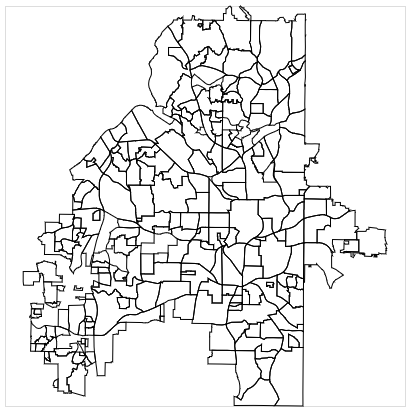

In [163]:
def gen_base(geojson):
    '''Generates baselayer of DC ANC map'''
    base = alt.Chart(alt.Data(values=geojson)).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=400,
        height=400
    )
    return base

json_file = download_json()
base_layer = gen_base(geojson=json_file)
base_layer

In [167]:
# Convert GeoJSON to Geopandas Dataframe 
gdf = gpd.GeoDataFrame.from_features((json_file))
gdf.head()

,ACRES,CREATED_DATE,CREATED_USER,EFFECTDATE,ENDDATE,FULLFIPS,GEOTYPE,GLOBALID,LAST_EDITED_DATE,LAST_EDITED_USER,LEGALAREA,LOCALID,NAME,NPU,OBJECTID,OLDNAME,SQMILES,SRCREF,geometry
0,1445.99,None,None,None,None,None,Neighborhood,{0F0F81DD-5048-41DF-976F-9D82C35C6B0D},2018-11-01T13:22:37.000Z,GIS,None,None,Morningside/Lenox Park,F,248,Morningside-Lenox Park,2.26,None,POLYGON ((-84.34858626436314 33.80455320334585...
1,928.25,None,None,None,None,None,Neighborhood,{574B2215-C2CA-4719-B687-D6FA8D201AAC},2018-11-01T14:25:05.000Z,GIS,None,None,East Atlanta,W,249,East Atlanta,1.45,None,POLYGON ((-84.34434183292035 33.74559105253244...
2,670.42,None,None,None,None,None,Neighborhood,{3457E2EB-86D1-4E12-B2B0-194AD6A4FFC5},2018-11-01T13:42:11.000Z,GIS,None,None,Virginia Highland,F,214,Virginia-Highland,1.05,None,POLYGON ((-84.34882014101247 33.78757541686366...
3,783.10,None,None,None,None,None,Neighborhood,{933AD6B6-681B-4748-8268-7F6C957FE691},2018-05-15T13:24:10.000Z,GIS,None,None,Old Fourth Ward,M,201,Old Fourth Ward,1.22,None,POLYGON ((-84.36457818043675 33.77336571189033...
4,241.95,None,None,None,None,None,Neighborhood,{2B63D8A7-D37E-42E1-B0FC-7108E65264AF},2018-05-15T13:24:10.000Z,GIS,None,None,Wilson Mill Meadows,H,87,Wilson Mill Meadows,0.38,None,POLYGON ((-84.51475839506296 33.75426956783958...


In [169]:
viz_df = gdf.merge(df_2018_nbhood, left_on="NAME", right_on="Neighborhood", how='outer')
viz_df.head()

,ACRES,CREATED_DATE,CREATED_USER,EFFECTDATE,ENDDATE,FULLFIPS,GEOTYPE,GLOBALID,LAST_EDITED_DATE,LAST_EDITED_USER,...,AUTO THEFT,BURGLARY-NONRES,BURGLARY-RESIDENCE,HOMICIDE,LARCENY-FROM VEHICLE,LARCENY-NON VEHICLE,MANSLAUGHTER,ROBBERY-COMMERCIAL,ROBBERY-PEDESTRIAN,ROBBERY-RESIDENCE
0,1445.99,None,None,None,None,None,Neighborhood,{0F0F81DD-5048-41DF-976F-9D82C35C6B0D},2018-11-01T13:22:37.000Z,GIS,...,37.0,3.0,15.0,1.0,204.0,41.0,0.0,0.0,2.0,1.0
1,928.25,None,None,None,None,None,Neighborhood,{574B2215-C2CA-4719-B687-D6FA8D201AAC},2018-11-01T14:25:05.000Z,GIS,...,25.0,7.0,36.0,0.0,112.0,36.0,0.0,7.0,16.0,0.0
2,670.42,None,None,None,None,None,Neighborhood,{3457E2EB-86D1-4E12-B2B0-194AD6A4FFC5},2018-11-01T13:42:11.000Z,GIS,...,25.0,5.0,8.0,0.0,162.0,28.0,0.0,0.0,7.0,2.0
3,783.10,None,None,None,None,None,Neighborhood,{933AD6B6-681B-4748-8268-7F6C957FE691},2018-05-15T13:24:10.000Z,GIS,...,53.0,15.0,39.0,2.0,233.0,162.0,0.0,0.0,13.0,6.0
4,241.95,None,None,None,None,None,Neighborhood,{2B63D8A7-D37E-42E1-B0FC-7108E65264AF},2018-05-15T13:24:10.000Z,GIS,...,4.0,0.0,5.0,0.0,2.0,4.0,0.0,0.0,1.0,0.0


In [171]:
# gdf['centroid_lon'] = gdf['geometry'].centroid.x
# gdf['centroid_lat'] = gdf['geometry'].centroid.y
# gdf.head()


viz_df['centroid_lon'] = viz_df['geometry'].centroid.x
viz_df['centroid_lat'] = viz_df['geometry'].centroid.y
viz_df.head()

,ACRES,CREATED_DATE,CREATED_USER,EFFECTDATE,ENDDATE,FULLFIPS,GEOTYPE,GLOBALID,LAST_EDITED_DATE,LAST_EDITED_USER,...,BURGLARY-RESIDENCE,HOMICIDE,LARCENY-FROM VEHICLE,LARCENY-NON VEHICLE,MANSLAUGHTER,ROBBERY-COMMERCIAL,ROBBERY-PEDESTRIAN,ROBBERY-RESIDENCE,centroid_lon,centroid_lat
0,1445.99,None,None,None,None,None,Neighborhood,{0F0F81DD-5048-41DF-976F-9D82C35C6B0D},2018-11-01T13:22:37.000Z,GIS,...,15.0,1.0,204.0,41.0,0.0,0.0,2.0,1.0,-84.356400,33.799335
1,928.25,None,None,None,None,None,Neighborhood,{574B2215-C2CA-4719-B687-D6FA8D201AAC},2018-11-01T14:25:05.000Z,GIS,...,36.0,0.0,112.0,36.0,0.0,7.0,16.0,0.0,-84.337053,33.734974
2,670.42,None,None,None,None,None,Neighborhood,{3457E2EB-86D1-4E12-B2B0-194AD6A4FFC5},2018-11-01T13:42:11.000Z,GIS,...,8.0,0.0,162.0,28.0,0.0,0.0,7.0,2.0,-84.358428,33.781454
3,783.10,None,None,None,None,None,Neighborhood,{933AD6B6-681B-4748-8268-7F6C957FE691},2018-05-15T13:24:10.000Z,GIS,...,39.0,2.0,233.0,162.0,0.0,0.0,13.0,6.0,-84.370884,33.764564
4,241.95,None,None,None,None,None,Neighborhood,{2B63D8A7-D37E-42E1-B0FC-7108E65264AF},2018-05-15T13:24:10.000Z,GIS,...,5.0,0.0,2.0,4.0,0.0,0.0,1.0,0.0,-84.521245,33.750822


In [172]:
choro_json = json.loads(viz_df.to_json())
choro_data = alt.Data(values=choro_json['features'])

In [173]:
viz_df.columns

Index(['ACRES', 'CREATED_DATE', 'CREATED_USER', 'EFFECTDATE', 'ENDDATE',
       'FULLFIPS', 'GEOTYPE', 'GLOBALID', 'LAST_EDITED_DATE',
       'LAST_EDITED_USER', 'LEGALAREA', 'LOCALID', 'NAME', 'NPU', 'OBJECTID',
       'OLDNAME', 'SQMILES', 'SRCREF', 'geometry', 'AGG ASSAULT', 'AUTO THEFT',
       'BURGLARY-NONRES', 'BURGLARY-RESIDENCE', 'HOMICIDE',
       'LARCENY-FROM VEHICLE', 'LARCENY-NON VEHICLE', 'MANSLAUGHTER',
       'ROBBERY-COMMERCIAL', 'ROBBERY-PEDESTRIAN', 'ROBBERY-RESIDENCE',
       'centroid_lon', 'centroid_lat'],
      dtype='object')

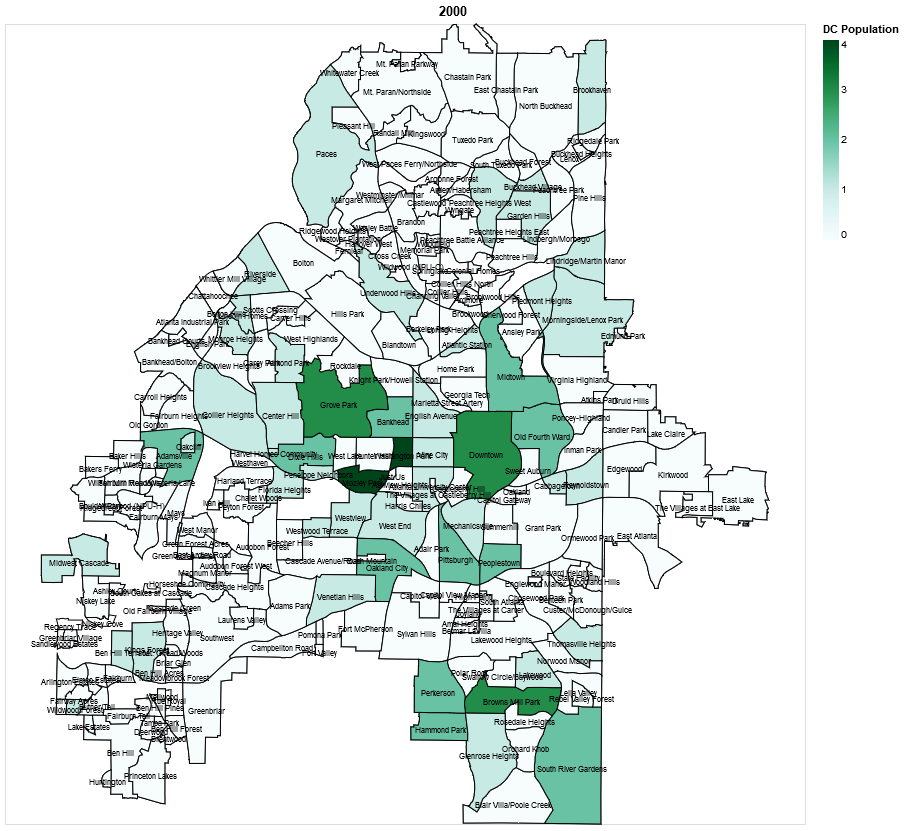

In [174]:
def gen_map(geodata, color_column, title):
    '''Generates DC ANC map with population choropleth and ANC labels'''
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=800,
        height=800
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme='bluegreen'),
                  title = "DC Population")
    )
    # Add Labels Layer
    labels = alt.Chart(geodata).mark_text(baseline='top'
     ).properties(
        width=800,
        height=800
     ).encode(
         longitude='properties.centroid_lon:Q',
         latitude='properties.centroid_lat:Q',
         text='properties.NAME:O',
         size=alt.value(8),
         opacity=alt.value(1)
     )

    return base + choro + labels

pop_2000_map = gen_map(geodata=choro_data, color_column='properties.HOMICIDE', title='2000')
pop_2000_map

In [119]:
viz_df.shape

(244, 30)

In [120]:
gdf.shape

(244, 19)

In [175]:
def gen_map(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''
    
    # Add Base Layer
    base = alt.Chart(alt.Data(values=anc_json)).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=700,
        height=700
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme=color_scheme),
                  title = "Auto Thefts"),
         tooltip=tooltip
    )
    
    return base + choro
#     return base

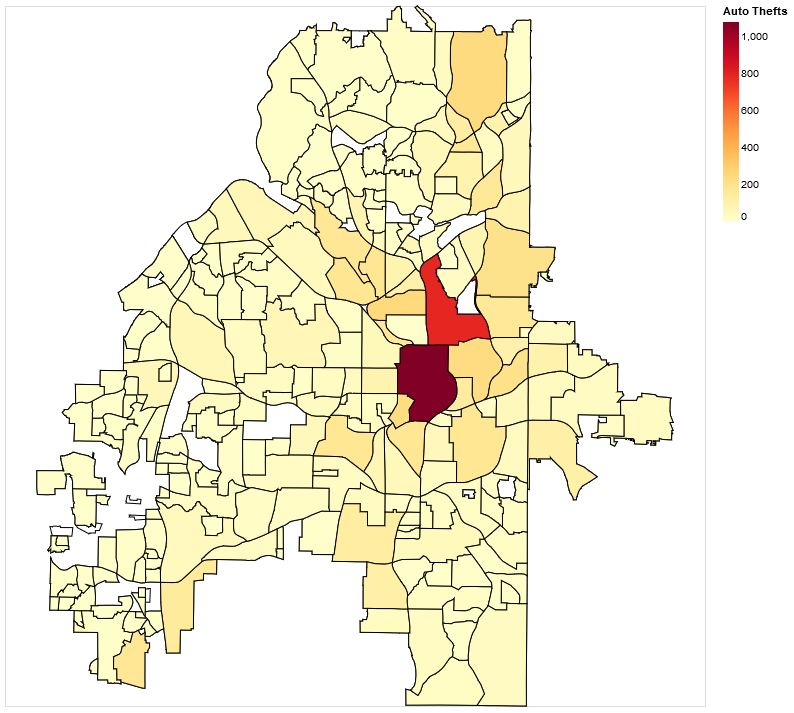

In [176]:
atl_map = gen_map(geodata=choro_data, color_column='properties.LARCENY-FROM VEHICLE', 
                      title='Atlanta: Overall Crime Rate', tooltip=[alt.Tooltip('properties.NAME:O', title="Neighborhood"), alt.Tooltip('properties.LARCENY-FROM VEHICLE:Q', title="Overall Crime Rate")], 
                      color_scheme='yelloworangered')

atl_map